# Yoga Pose Recognition Using CNNs

Custom CNN baseline with fine-tuned MobileNetV2 and ResNet50, plus evaluation and explainability.

In [1]:
# Optional package setup with a non-deprecated checker
import sys
import subprocess
import importlib.util

def ensure_package(module_name, pip_name=None):
    if importlib.util.find_spec(module_name) is None:
        subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", pip_name or module_name])

ensure_package("shap")
import shap
print("shap version:", shap.__version__)

shap version: 0.51.0


In [2]:
import os
import time
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    confusion_matrix,
    classification_report,
)
from sklearn.utils.class_weight import compute_class_weight

print("TensorFlow:", tf.__version__)
print("Keras:", keras.__version__)

2026-06-06 15:45:39.354081: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1780760739.554468      23 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1780760739.613318      23 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1780760740.103621      23 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1780760740.103670      23 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1780760740.103673      23 computation_placer.cc:177] computation placer alr

TensorFlow: 2.19.0
Keras: 3.13.2


In [3]:
# Reproducibility and configuration
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

DATA_DIR = "/kaggle/input/datasets/gendubali/47-yoga-pose-detection"
OUTPUT_DIR = "/kaggle/working/yoga_pose_outputs"
FIG_DIR = os.path.join(OUTPUT_DIR, "figures")
TAB_DIR = os.path.join(OUTPUT_DIR, "tables")
MODEL_DIR = os.path.join(OUTPUT_DIR, "models")

for d in [OUTPUT_DIR, FIG_DIR, TAB_DIR, MODEL_DIR]:
    os.makedirs(d, exist_ok=True)

IMG_SIZE = (224, 224)
BATCH_SIZE = 16
EPOCHS = 60
AUTOTUNE = tf.data.AUTOTUNE

print("DATA_DIR exists:", os.path.exists(DATA_DIR))
print("OUTPUT_DIR:", OUTPUT_DIR)

DATA_DIR exists: True
OUTPUT_DIR: /kaggle/working/yoga_pose_outputs


In [4]:
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def find_dataset_root(base_dir):
    base = Path(base_dir)
    if not base.exists():
        raise FileNotFoundError(f"Dataset path not found: {base}")

    for split_name in ["train", "training", "Train"]:
        split_dir = base / split_name
        if split_dir.exists() and split_dir.is_dir():
            if any(p.is_dir() for p in split_dir.iterdir()):
                return split_dir

    return base

ROOT_DIR = find_dataset_root(DATA_DIR)
class_names = sorted([p.name for p in Path(ROOT_DIR).iterdir() if p.is_dir()])

if not class_names:
    raise ValueError(f"No class subfolders found under {ROOT_DIR}.")

print("Using root directory:", ROOT_DIR)
print("Number of classes:", len(class_names))
print("First classes:", class_names[:10])

Using root directory: /kaggle/input/datasets/gendubali/47-yoga-pose-detection
Number of classes: 47
First classes: ['Adho Mukha Svanasana', 'Adho Mukha Vrksasana', 'Alanasana', 'Anjaneyasana', 'Ardha Chandrasana', 'Ardha Matsyendrasana', 'Ardha Navasana', 'Ardha Pincha Mayurasana', 'Ashta Chandrasana', 'Baddha Konasana']


In [5]:
# Build image path list
all_paths = []
all_labels = []

for class_idx, class_name in enumerate(class_names):
    class_dir = Path(ROOT_DIR) / class_name
    for p in class_dir.rglob("*"):
        if p.is_file() and p.suffix.lower() in IMG_EXTS:
            all_paths.append(str(p))
            all_labels.append(class_idx)

all_paths = np.array(all_paths)
all_labels = np.array(all_labels)

print("Total images:", len(all_paths))
if len(all_paths) == 0:
    raise ValueError("No images found. Check the dataset path and file extensions.")

Total images: 59759


In [6]:
# Save dataset description table
counts_df = pd.DataFrame({
    "class_name": class_names,
    "image_count": [int(np.sum(all_labels == i)) for i in range(len(class_names))]
}).sort_values("image_count", ascending=False)

counts_df.to_csv(os.path.join(TAB_DIR, "dataset_class_counts.csv"), index=False)
counts_df.head()

,class_name,image_count
1,Adho Mukha Vrksasana,1400
2,Alanasana,1400
3,Anjaneyasana,1400
4,Ardha Chandrasana,1400
10,Bakasana,1400


I0000 00:00:1780761032.308516      23 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


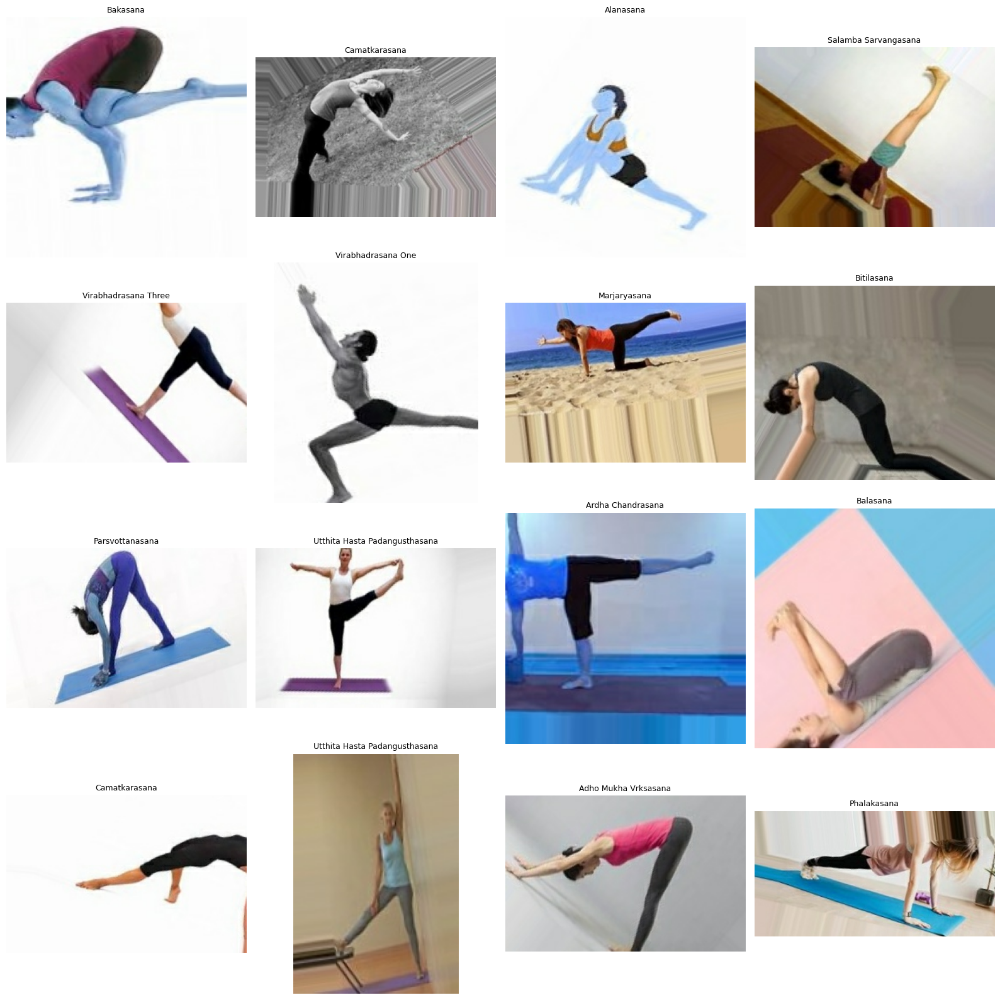

In [7]:
# Dataset sample figure
def plot_sample_grid(paths, labels, class_labels, filename="dataset_samples.pdf", n=16):
    n = min(n, len(paths))
    idxs = np.random.choice(len(paths), size=n, replace=False)
    cols = 4
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(16, 4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, idx in zip(axes, idxs):
        img = tf.io.read_file(paths[idx])
        img = tf.image.decode_image(img, channels=3, expand_animations=False)
        ax.imshow(tf.cast(img, tf.uint8))
        ax.set_title(class_labels[labels[idx]], fontsize=9)
        ax.axis("off")

    for ax in axes[len(idxs):]:
        ax.axis("off")

    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, filename), format="pdf", bbox_inches="tight")
    plt.show()
    plt.close()

plot_sample_grid(all_paths, all_labels, class_names)

In [8]:
# Stratified train / validation / test split
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    all_paths,
    all_labels,
    test_size=0.30,
    random_state=SEED,
    stratify=all_labels,
)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths,
    temp_labels,
    test_size=0.50,
    random_state=SEED,
    stratify=temp_labels,
)

print("Train:", len(train_paths))
print("Validation:", len(val_paths))
print("Test:", len(test_paths))

class_weight_values = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_labels),
    y=train_labels,
)
class_weight = {i: float(w) for i, w in enumerate(class_weight_values)}
class_weight

Train: 41831
Validation: 8964
Test: 8964


{0: 0.9128423349699946,
 1: 0.9081849761181068,
 2: 0.9081849761181068,
 3: 0.9081849761181068,
 4: 0.9081849761181068,
 5: 0.9769717635518602,
 6: 1.442498017173006,
 7: 0.9716389482486296,
 8: 1.1946594316721406,
 9: 0.982363439951153,
 10: 0.9081849761181068,
 11: 0.9358793655055149,
 12: 1.1573748720360788,
 13: 1.142517684975282,
 14: 1.0034061742905802,
 15: 0.9081849761181068,
 16: 0.9081849761181068,
 17: 0.950877432260411,
 18: 1.0749049234248125,
 19: 0.950877432260411,
 20: 1.3165995215913382,
 21: 1.0557785012998158,
 22: 0.9408258737798569,
 23: 1.088045570410446,
 24: 0.9081849761181068,
 25: 0.9081849761181068,
 26: 1.0557785012998158,
 27: 0.9081849761181068,
 28: 1.0684529130801257,
 29: 1.1001499092654445,
 30: 1.1866950354609929,
 31: 1.0814353300069801,
 32: 0.9081849761181068,
 33: 0.9081849761181068,
 34: 1.375612483146437,
 35: 0.9081849761181068,
 36: 0.9769717635518602,
 37: 0.9081849761181068,
 38: 0.9081849761181068,
 39: 0.9081849761181068,
 40: 0.9081849761

In [9]:
# tf.data pipeline
def load_image(path, label, img_size=IMG_SIZE):
    image = tf.io.read_file(path)
    image = tf.image.decode_image(image, channels=3, expand_animations=False)
    image.set_shape([None, None, 3])
    image = tf.image.resize(image, img_size)
    image = tf.cast(image, tf.float32)
    label = tf.cast(label, tf.int32)
    return image, label

def make_dataset(paths, labels, training=False, batch_size=BATCH_SIZE):
    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    if training:
        ds = ds.shuffle(buffer_size=len(paths), seed=SEED, reshuffle_each_iteration=True)
    ds = ds.map(load_image, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(AUTOTUNE)
    return ds

train_ds = make_dataset(train_paths, train_labels, training=True)
val_ds = make_dataset(val_paths, val_labels, training=False)
test_ds = make_dataset(test_paths, test_labels, training=False)

print(train_ds)
print(val_ds)
print(test_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [10]:
# Utilities
def save_line_plot(history, title, filename):
    hist = history.history
    epochs = range(1, len(hist["loss"]) + 1)

    fig, ax = plt.subplots(1, 2, figsize=(14, 5))
    ax[0].plot(epochs, hist["accuracy"], label="Train Accuracy")
    ax[0].plot(epochs, hist["val_accuracy"], label="Val Accuracy")
    ax[0].set_title(f"{title} - Accuracy")
    ax[0].set_xlabel("Epoch")
    ax[0].set_ylabel("Accuracy")
    ax[0].legend()

    ax[1].plot(epochs, hist["loss"], label="Train Loss")
    ax[1].plot(epochs, hist["val_loss"], label="Val Loss")
    ax[1].set_title(f"{title} - Loss")
    ax[1].set_xlabel("Epoch")
    ax[1].set_ylabel("Loss")
    ax[1].legend()

    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, filename), format="pdf", bbox_inches="tight")
    plt.show()
    plt.close()

def save_confusion_matrix(cm, labels, title, filename, normalize=False):
    fig, ax = plt.subplots(figsize=(12, 10))

    if normalize:
        cm = cm.astype("float") / np.maximum(cm.sum(axis=1, keepdims=True), 1)
        fmt = ".2f"
        cbar_label = "Normalized value"
    else:
        fmt = "d"
        cbar_label = "Count"

    im = ax.imshow(cm, cmap="Blues")
    ax.set_title(title)
    ax.set_xlabel("Predicted label")
    ax.set_ylabel("True label")
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=90, fontsize=7)
    ax.set_yticklabels(labels, fontsize=7)

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt), ha="center", va="center", fontsize=5)

    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=cbar_label)
    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, filename), format="pdf", bbox_inches="tight")
    plt.show()
    plt.close()

def save_class_recall_bar(cm, labels, filename):
    recalls = np.diag(cm) / np.maximum(cm.sum(axis=1), 1)
    fig, ax = plt.subplots(figsize=(14, 5))
    ax.bar(np.arange(len(labels)), recalls)
    ax.set_title("Per-class Recall")
    ax.set_xlabel("Class")
    ax.set_ylabel("Recall")
    ax.set_xticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, rotation=90, fontsize=7)
    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, filename), format="pdf", bbox_inches="tight")
    plt.show()
    plt.close()

def evaluate_predictions(y_true, y_pred, class_labels, model_name):
    acc = accuracy_score(y_true, y_pred)
    precision_w, recall_w, f1_w, _ = precision_recall_fscore_support(
        y_true, y_pred, average="weighted", zero_division=0
    )
    precision_m, recall_m, f1_m, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0
    )

    cm = confusion_matrix(y_true, y_pred)
    report = classification_report(
        y_true,
        y_pred,
        target_names=class_labels,
        output_dict=True,
        zero_division=0,
    )
    report_df = pd.DataFrame(report).T
    report_df.to_csv(os.path.join(TAB_DIR, f"{model_name}_classification_report.csv"))

    metrics = {
        "model": model_name,
        "accuracy": acc,
        "precision_weighted": precision_w,
        "recall_weighted": recall_w,
        "f1_weighted": f1_w,
        "precision_macro": precision_m,
        "recall_macro": recall_m,
        "f1_macro": f1_m,
        "num_classes": len(class_labels),
    }
    return metrics, cm

def get_predictions(model, dataset):
    y_true = []
    y_prob = []
    for batch_images, batch_labels in dataset:
        probs = model.predict(batch_images, verbose=0)
        y_prob.append(probs)
        y_true.append(batch_labels.numpy())
    y_true = np.concatenate(y_true, axis=0)
    y_prob = np.concatenate(y_prob, axis=0)
    y_pred = np.argmax(y_prob, axis=1)
    return y_true, y_pred, y_prob

def load_single_image(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_image(img, channels=3, expand_animations=False)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32)
    return img

def build_data_augmentation():
    return keras.Sequential(
        [
            layers.RandomFlip("horizontal"),
            layers.RandomRotation(0.08),
            layers.RandomZoom(0.10),
            layers.RandomTranslation(0.05, 0.05),
        ],
        name="augmentation",
    )

In [11]:
# Model builders
data_augmentation = build_data_augmentation()

def build_custom_cnn(input_shape=(224, 224, 3), num_classes=10):
    inputs = keras.Input(shape=input_shape)
    x = layers.Rescaling(1.0 / 255)(inputs)
    x = data_augmentation(x)

    x = layers.Conv2D(32, 3, padding="same", activation="relu", name="custom_conv1")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)

    x = layers.Conv2D(64, 3, padding="same", activation="relu", name="custom_conv2")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)

    x = layers.Conv2D(128, 3, padding="same", activation="relu", name="custom_conv3")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)

    x = layers.Conv2D(256, 3, padding="same", activation="relu", name="custom_conv4")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs, name="CustomCNN")
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )
    return model

def build_mobilenetv2(input_shape=(224, 224, 3), num_classes=10, fine_tune_at=100):
    inputs = keras.Input(shape=input_shape)
    x = data_augmentation(inputs)
    x = tf.keras.applications.mobilenet_v2.preprocess_input(x)

    base = tf.keras.applications.MobileNetV2(
        include_top=False,
        weights="imagenet",
        input_tensor=x,
    )
    base.trainable = True

    for layer in base.layers[:fine_tune_at]:
        layer.trainable = False

    x = base.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs, name="MobileNetV2")
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-4),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )
    return model

def build_resnet50(input_shape=(224, 224, 3), num_classes=10, fine_tune_at=150):
    inputs = keras.Input(shape=input_shape)
    x = data_augmentation(inputs)
    x = tf.keras.applications.resnet50.preprocess_input(x)

    base = tf.keras.applications.ResNet50(
        include_top=False,
        weights="imagenet",
        input_tensor=x,
    )
    base.trainable = True

    for layer in base.layers[:fine_tune_at]:
        layer.trainable = False

    x = base.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = keras.Model(inputs, outputs, name="ResNet50")
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-4),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"],
    )
    return model

print("Model builders ready.")

Model builders ready.


In [12]:
# Training helpers
def make_training_callbacks(patience=4, min_delta=1e-4):
    return [
        keras.callbacks.EarlyStopping(
            monitor="val_loss",
            patience=patience,
            min_delta=min_delta,
            restore_best_weights=True,
            verbose=1,
        ),
        keras.callbacks.ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.5,
            patience=max(1, patience // 2),
            min_lr=1e-6,
            verbose=1,
        ),
    ]

def train_model(model, model_name, patience=4, max_epochs=EPOCHS):
    start = time.time()
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=max_epochs,
        callbacks=make_training_callbacks(patience=patience),
        class_weight=class_weight,
        verbose=1,
    )
    elapsed = time.time() - start

    model.save(os.path.join(MODEL_DIR, f"{model_name}.keras"))
    pd.DataFrame(history.history).to_csv(
        os.path.join(TAB_DIR, f"{model_name}_history.csv"),
        index=False,
    )
    return history, elapsed

Model: "CustomCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augmentation (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_conv1 (Conv2D)           │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_conv2 (Conv2D)           │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_conv3 (Conv2D)           │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ custom_conv4 (Conv2D)           │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 47)             │         6,063 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 429,295 (1.64 MB)

 Trainable params: 428,335 (1.63 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/60


I0000 00:00:1780761044.462949      65 cuda_dnn.cc:529] Loaded cuDNN version 91002


2615/2615 ━━━━━━━━━━━━━━━━━━━━ 141s 51ms/step - accuracy: 0.0316 - loss: 3.8375 - val_accuracy: 0.0345 - val_loss: 3.8073 - learning_rate: 0.0010
Epoch 2/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 121s 46ms/step - accuracy: 0.0403 - loss: 3.7901 - val_accuracy: 0.0415 - val_loss: 3.7639 - learning_rate: 0.0010
Epoch 3/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 121s 46ms/step - accuracy: 0.0504 - loss: 3.7320 - val_accuracy: 0.0604 - val_loss: 3.6661 - learning_rate: 0.0010
Epoch 4/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 121s 46ms/step - accuracy: 0.0674 - loss: 3.6227 - val_accuracy: 0.0775 - val_loss: 3.5527 - learning_rate: 0.0010
Epoch 5/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 121s 46ms/step - accuracy: 0.0879 - loss: 3.5013 - val_accuracy: 0.1156 - val_loss: 3.3852 - learning_rate: 0.0010
Epoch 6/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 121s 46ms/step - accuracy: 0.1108 - loss: 3.3708 - val_accuracy: 0.1362 - val_loss: 3.3214 - learning_rate: 0.0010
Epoch 7/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 122s 47ms/step - accuracy: 

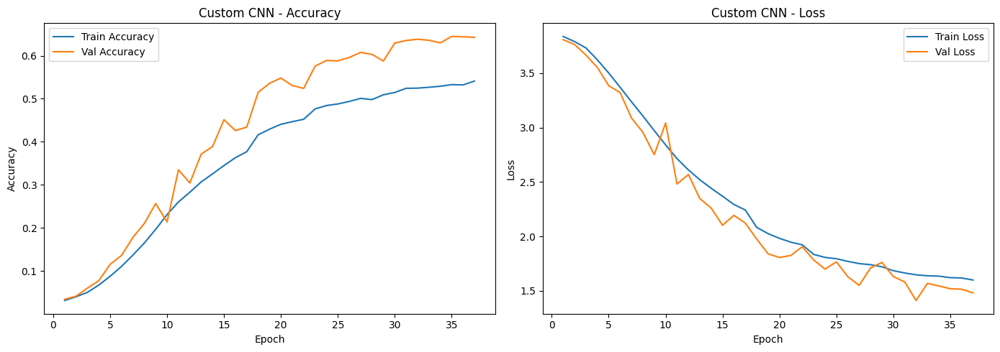

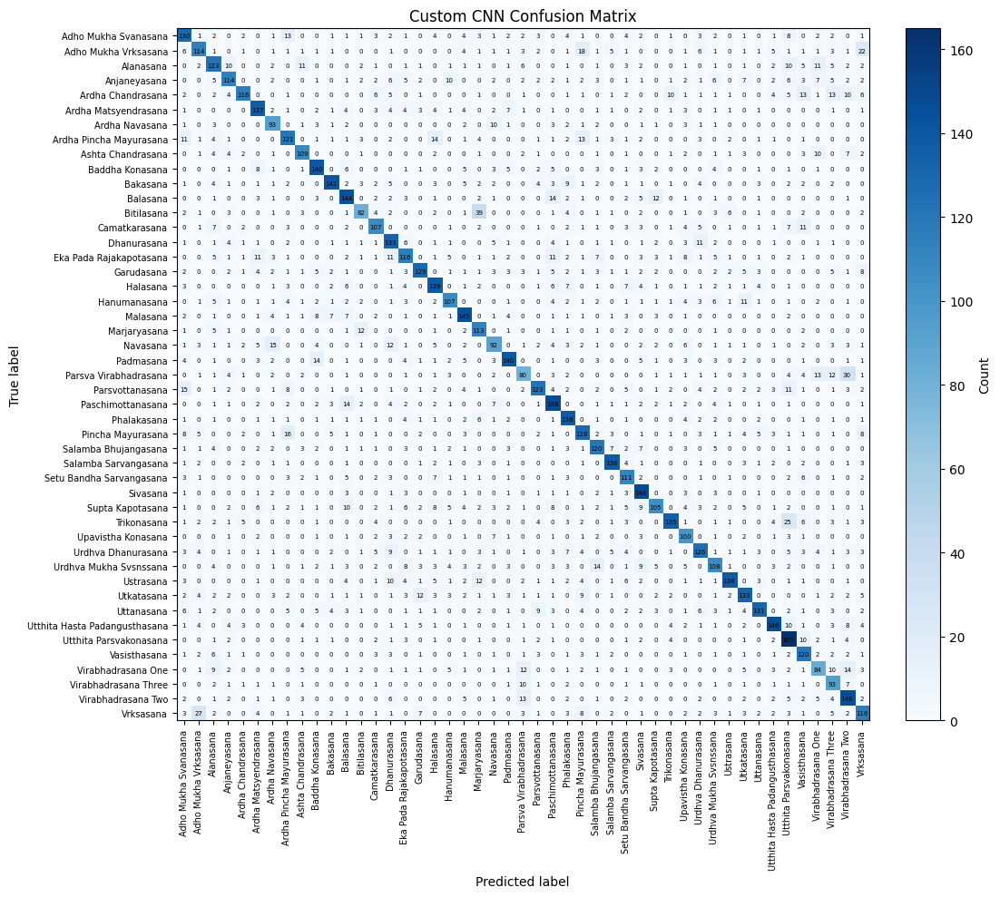

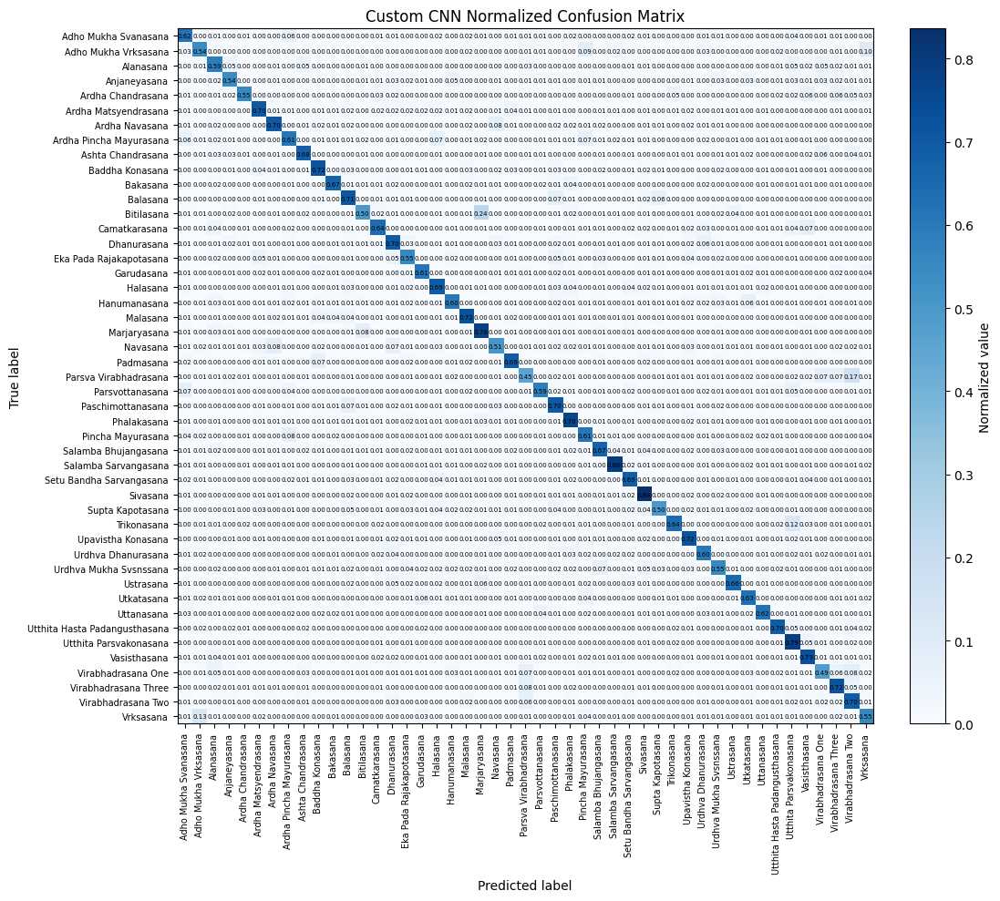

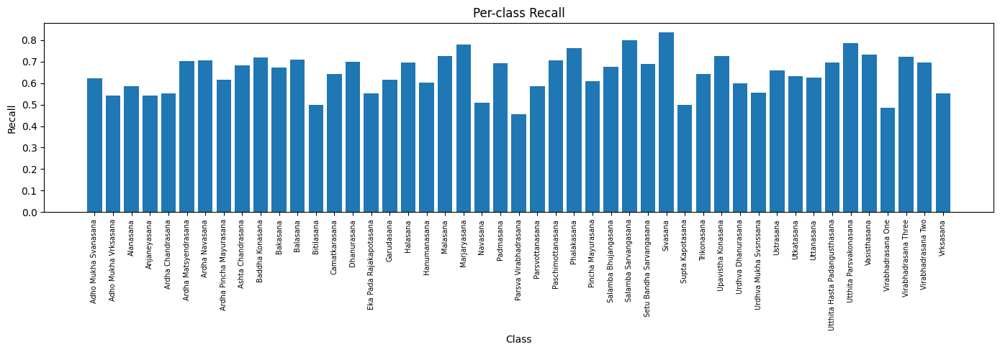

{'model': 'custom_cnn',
 'accuracy': 0.643128067826863,
 'precision_weighted': 0.6521999224929655,
 'recall_weighted': 0.643128067826863,
 'f1_weighted': 0.6424467892882555,
 'precision_macro': 0.6485819168967542,
 'recall_macro': 0.6461719097391537,
 'f1_macro': 0.6419913311272535,
 'num_classes': 47,
 'training_time_sec': 4516.927797794342,
 'num_parameters': 429295}

In [13]:
# Train Custom CNN
tf.keras.backend.clear_session()
custom_cnn = build_custom_cnn(input_shape=IMG_SIZE + (3,), num_classes=len(class_names))
custom_cnn.summary()

custom_history, custom_time = train_model(custom_cnn, "custom_cnn", patience=5)
save_line_plot(custom_history, "Custom CNN", "custom_cnn_training_curves.pdf")

y_true_c, y_pred_c, y_prob_c = get_predictions(custom_cnn, test_ds)
custom_metrics, cm_custom = evaluate_predictions(y_true_c, y_pred_c, class_names, "custom_cnn")
save_confusion_matrix(cm_custom, class_names, "Custom CNN Confusion Matrix", "custom_cnn_confusion_matrix.pdf")
save_confusion_matrix(cm_custom, class_names, "Custom CNN Normalized Confusion Matrix", "custom_cnn_confusion_matrix_normalized.pdf", normalize=True)
save_class_recall_bar(cm_custom, class_names, "custom_cnn_class_recall.pdf")
custom_metrics["training_time_sec"] = custom_time
custom_metrics["num_parameters"] = custom_cnn.count_params()
custom_metrics

/tmp/ipykernel_23/1025335340.py:43: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base = tf.keras.applications.MobileNetV2(


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "MobileNetV2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ augmentation        │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ true_divide         │ (None, 224, 224,  │          0 │ augmentation[1][… │
│ (TrueDivide)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subtract (Subtract) │ (None, 224, 224,  │          0 │ true_divide[0][0] │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ subtract[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0

 Total params: 2,428,015 (9.26 MB)

 Trainable params: 2,032,623 (7.75 MB)

 Non-trainable params: 395,392 (1.51 MB)

Epoch 1/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 148s 51ms/step - accuracy: 0.2992 - loss: 2.6680 - val_accuracy: 0.5840 - val_loss: 1.5241 - learning_rate: 1.0000e-04
Epoch 2/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 132s 51ms/step - accuracy: 0.5757 - loss: 1.5545 - val_accuracy: 0.7052 - val_loss: 1.0552 - learning_rate: 1.0000e-04
Epoch 3/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 132s 51ms/step - accuracy: 0.6854 - loss: 1.1210 - val_accuracy: 0.7577 - val_loss: 0.8371 - learning_rate: 1.0000e-04
Epoch 4/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 133s 51ms/step - accuracy: 0.7504 - loss: 0.8784 - val_accuracy: 0.8143 - val_loss: 0.6354 - learning_rate: 1.0000e-04
Epoch 5/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 133s 51ms/step - accuracy: 0.7963 - loss: 0.7087 - val_accuracy: 0.8332 - val_loss: 0.5741 - learning_rate: 1.0000e-04
Epoch 6/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 133s 51ms/step - accuracy: 0.8251 - loss: 0.6040 - val_accuracy: 0.8491 - val_loss: 0.5171 - learning_rate: 1.0000e-04
Epoch 7/60
2615/2615 ━━━━━━━━━━━━━

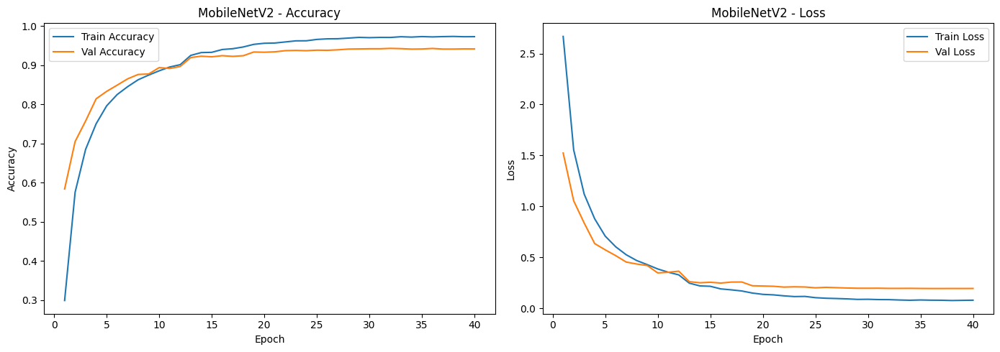

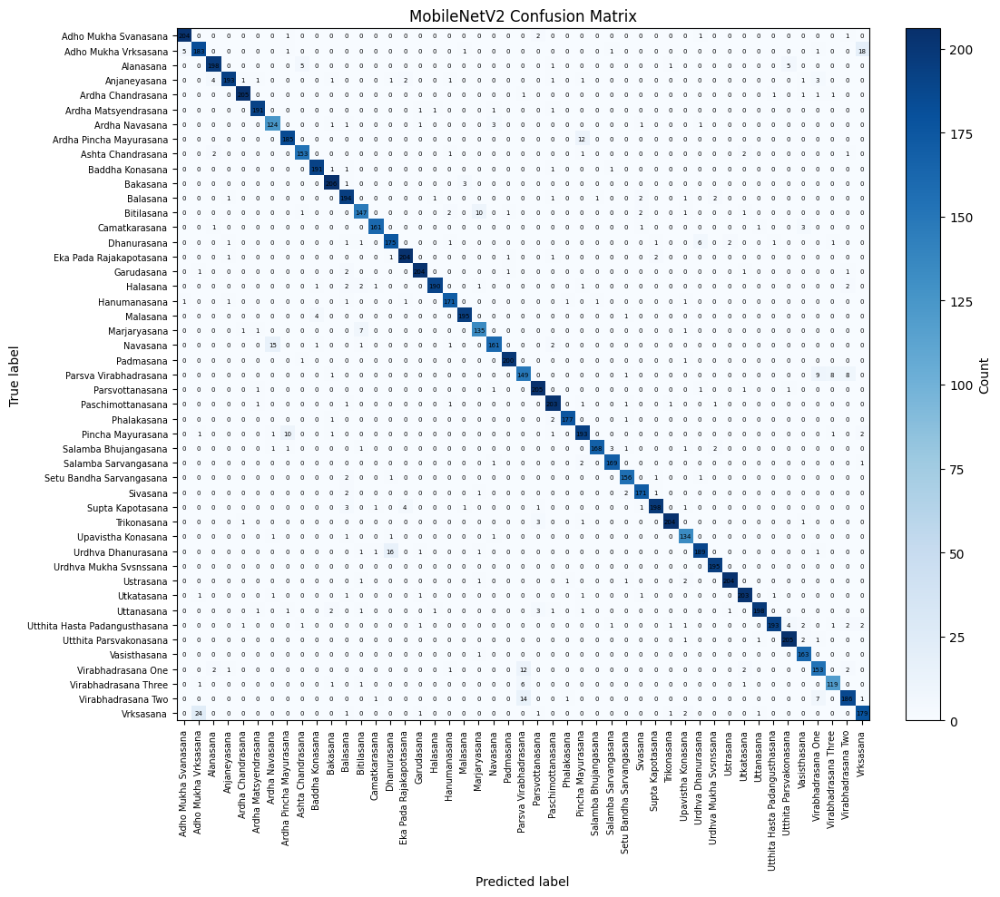

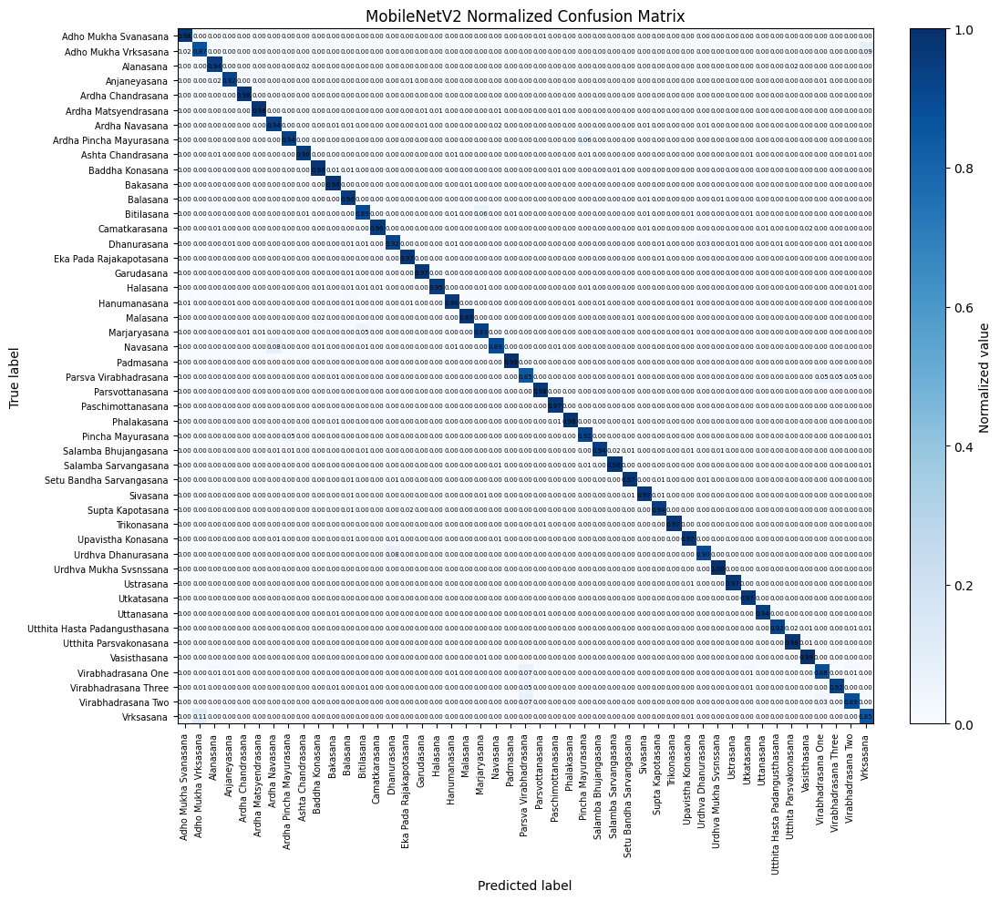

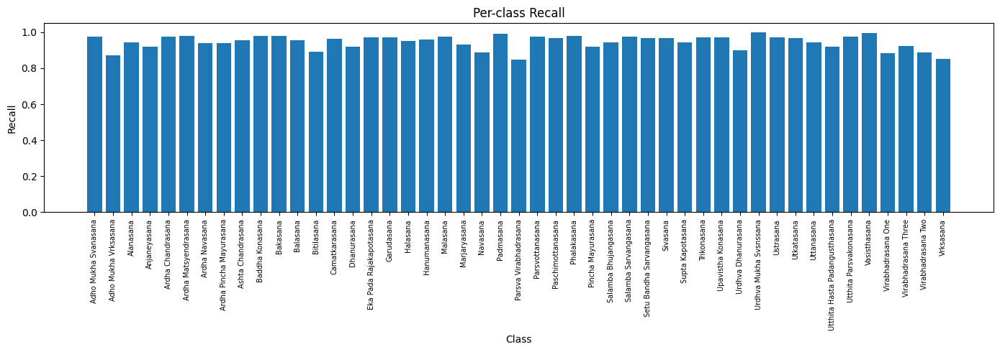

{'model': 'mobilenetv2',
 'accuracy': 0.9464524765729585,
 'precision_weighted': 0.9469876705659912,
 'recall_weighted': 0.9464524765729585,
 'f1_weighted': 0.946482377068004,
 'precision_macro': 0.9451392874166575,
 'recall_macro': 0.9462473701328059,
 'f1_macro': 0.9454448846089024,
 'num_classes': 47,
 'training_time_sec': 5355.641909122467,
 'num_parameters': 2428015}

In [14]:
# Train MobileNetV2
tf.keras.backend.clear_session()
mobilenetv2 = build_mobilenetv2(input_shape=IMG_SIZE + (3,), num_classes=len(class_names), fine_tune_at=100)
mobilenetv2.summary()

mobile_history, mobile_time = train_model(mobilenetv2, "mobilenetv2", patience=4)
save_line_plot(mobile_history, "MobileNetV2", "mobilenetv2_training_curves.pdf")

y_true_m, y_pred_m, y_prob_m = get_predictions(mobilenetv2, test_ds)
mobile_metrics, cm_mobile = evaluate_predictions(y_true_m, y_pred_m, class_names, "mobilenetv2")
save_confusion_matrix(cm_mobile, class_names, "MobileNetV2 Confusion Matrix", "mobilenetv2_confusion_matrix.pdf")
save_confusion_matrix(cm_mobile, class_names, "MobileNetV2 Normalized Confusion Matrix", "mobilenetv2_confusion_matrix_normalized.pdf", normalize=True)
save_class_recall_bar(cm_mobile, class_names, "mobilenetv2_class_recall.pdf")
mobile_metrics["training_time_sec"] = mobile_time
mobile_metrics["num_parameters"] = mobilenetv2.count_params()
mobile_metrics

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ augmentation        │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ augmentation[2][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ augmentation[2][… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ augmentation[2][… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ add[0][0]         │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r

 Total params: 23,856,047 (91.00 MB)

 Trainable params: 12,357,679 (47.14 MB)

 Non-trainable params: 11,498,368 (43.86 MB)

Epoch 1/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 214s 77ms/step - accuracy: 0.3828 - loss: 2.3646 - val_accuracy: 0.6815 - val_loss: 1.1761 - learning_rate: 1.0000e-04
Epoch 2/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 197s 75ms/step - accuracy: 0.6798 - loss: 1.1634 - val_accuracy: 0.7979 - val_loss: 0.7135 - learning_rate: 1.0000e-04
Epoch 3/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 197s 75ms/step - accuracy: 0.7881 - loss: 0.7659 - val_accuracy: 0.8584 - val_loss: 0.5017 - learning_rate: 1.0000e-04
Epoch 4/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 198s 76ms/step - accuracy: 0.8382 - loss: 0.5718 - val_accuracy: 0.8776 - val_loss: 0.4437 - learning_rate: 1.0000e-04
Epoch 5/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 197s 75ms/step - accuracy: 0.8676 - loss: 0.4607 - val_accuracy: 0.8800 - val_loss: 0.4052 - learning_rate: 1.0000e-04
Epoch 6/60
2615/2615 ━━━━━━━━━━━━━━━━━━━━ 197s 75ms/step - accuracy: 0.8895 - loss: 0.3894 - val_accuracy: 0.9034 - val_loss: 0.3303 - learning_rate: 1.0000e-04
Epoch 7/60
2615/2615 ━━━━━━━━━━━━━

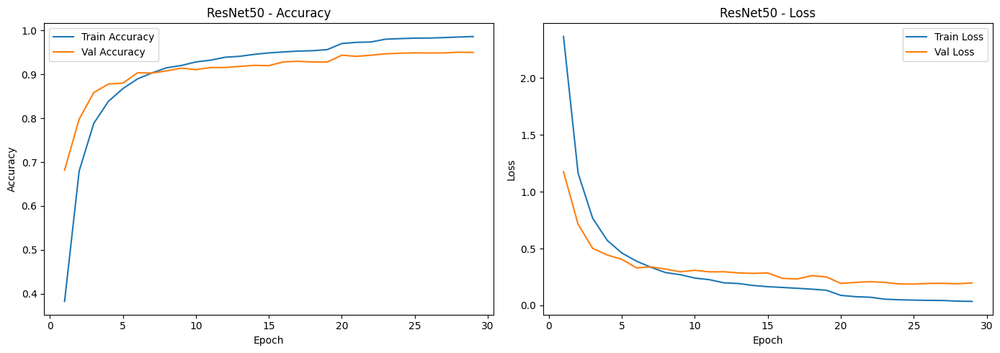

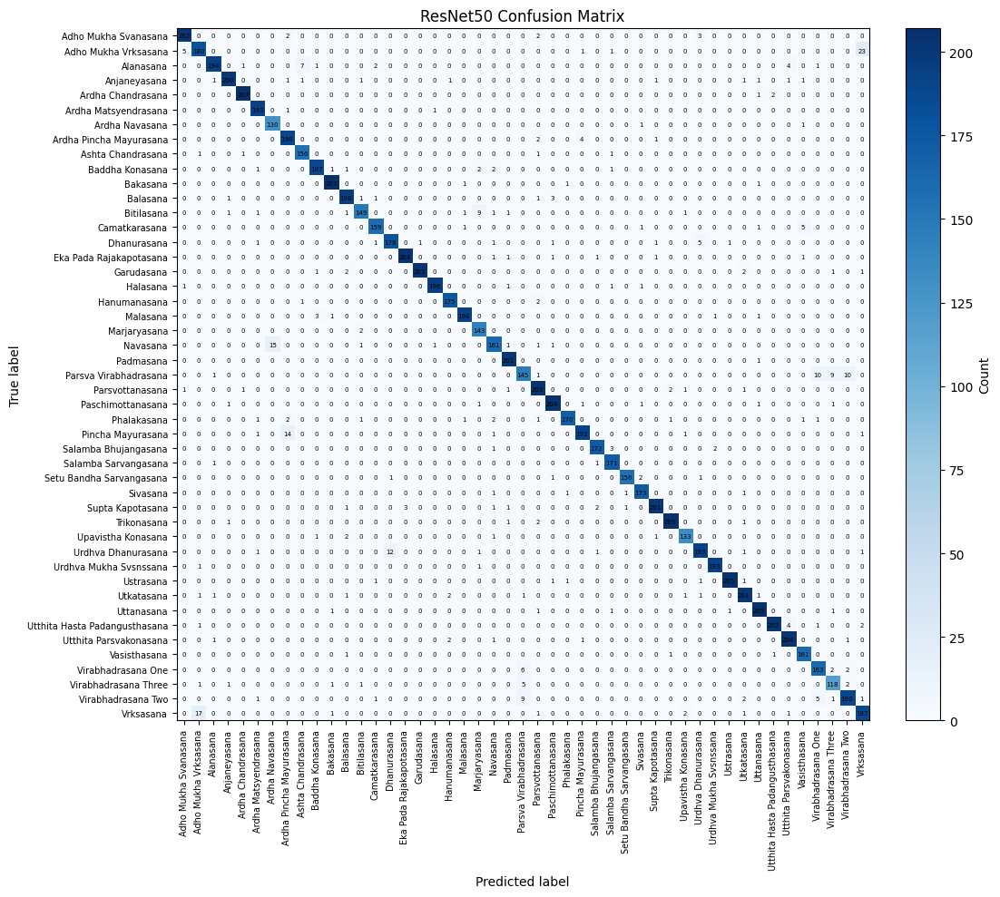

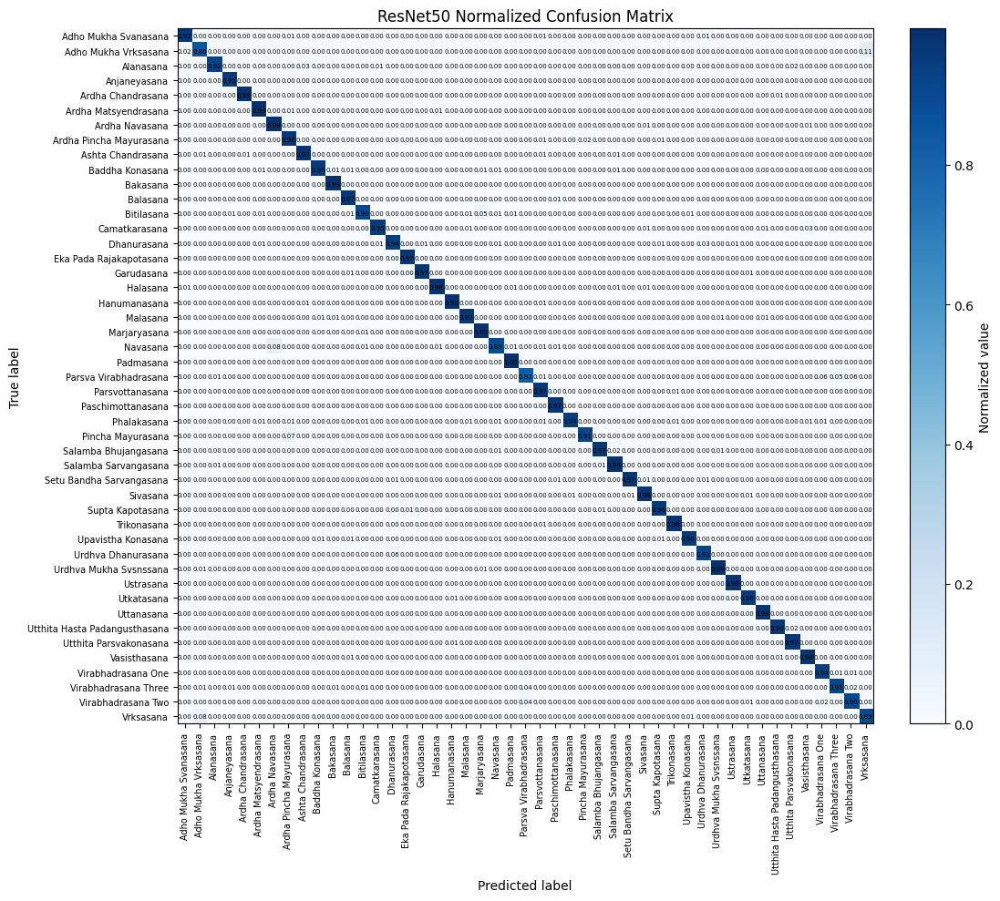

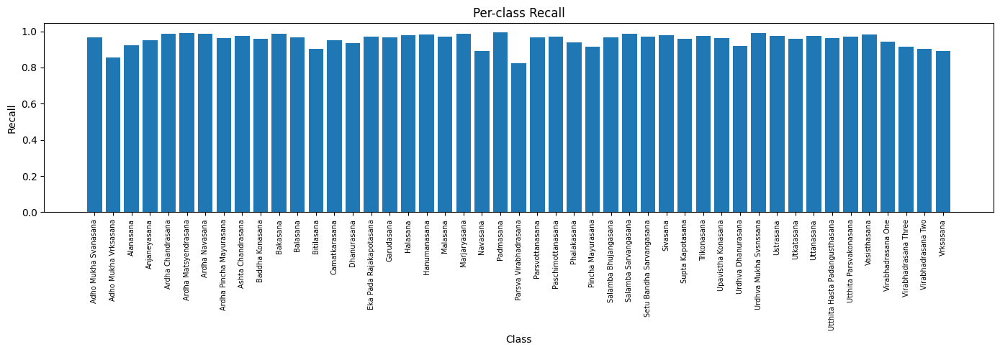

{'model': 'resnet50',
 'accuracy': 0.9540383757251227,
 'precision_weighted': 0.9543869407801538,
 'recall_weighted': 0.9540383757251227,
 'f1_weighted': 0.9539706085741491,
 'precision_macro': 0.9529598964950069,
 'recall_macro': 0.9541054607176461,
 'f1_macro': 0.9532684641313417,
 'num_classes': 47,
 'training_time_sec': 5689.209918022156,
 'num_parameters': 23856047}

In [15]:
# Train ResNet50
tf.keras.backend.clear_session()
resnet50 = build_resnet50(input_shape=IMG_SIZE + (3,), num_classes=len(class_names), fine_tune_at=150)
resnet50.summary()

resnet_history, resnet_time = train_model(resnet50, "resnet50", patience=4)
save_line_plot(resnet_history, "ResNet50", "resnet50_training_curves.pdf")

y_true_r, y_pred_r, y_prob_r = get_predictions(resnet50, test_ds)
resnet_metrics, cm_resnet = evaluate_predictions(y_true_r, y_pred_r, class_names, "resnet50")
save_confusion_matrix(cm_resnet, class_names, "ResNet50 Confusion Matrix", "resnet50_confusion_matrix.pdf")
save_confusion_matrix(cm_resnet, class_names, "ResNet50 Normalized Confusion Matrix", "resnet50_confusion_matrix_normalized.pdf", normalize=True)
save_class_recall_bar(cm_resnet, class_names, "resnet50_class_recall.pdf")
resnet_metrics["training_time_sec"] = resnet_time
resnet_metrics["num_parameters"] = resnet50.count_params()
resnet_metrics

In [16]:
# Comparison table
comparison_df = pd.DataFrame([custom_metrics, mobile_metrics, resnet_metrics])
comparison_df = comparison_df[[
    "model",
    "accuracy",
    "precision_weighted",
    "recall_weighted",
    "f1_weighted",
    "precision_macro",
    "recall_macro",
    "f1_macro",
    "training_time_sec",
    "num_parameters",
    "num_classes",
]]
comparison_df.to_csv(os.path.join(TAB_DIR, "model_comparison.csv"), index=False)
comparison_df

,model,accuracy,precision_weighted,recall_weighted,f1_weighted,precision_macro,recall_macro,f1_macro,training_time_sec,num_parameters,num_classes
0,custom_cnn,0.643128,0.652200,0.643128,0.642447,0.648582,0.646172,0.641991,4516.927798,429295,47
1,mobilenetv2,0.946452,0.946988,0.946452,0.946482,0.945139,0.946247,0.945445,5355.641909,2428015,47
2,resnet50,0.954038,0.954387,0.954038,0.953971,0.952960,0.954105,0.953268,5689.209918,23856047,47


In [17]:
# Robust Grad-CAM helpers
def find_last_conv_layer_recursive(model):
    # Return (container_model, layer_name) for the last convolutional layer found.
    for layer in reversed(model.layers):
        if isinstance(layer, keras.Model):
            try:
                return find_last_conv_layer_recursive(layer)
            except ValueError:
                pass
        if isinstance(layer, (layers.Conv2D, layers.DepthwiseConv2D, layers.SeparableConv2D)):
            return model, layer.name
    raise ValueError("No convolutional layer found in the model.")

def make_gradcam_heatmap(img_array, model, pred_index=None):
    container_model, last_conv_layer_name = find_last_conv_layer_recursive(model)
    last_conv_layer = container_model.get_layer(last_conv_layer_name)

    grad_model = keras.Model(
        model.inputs,
        [last_conv_layer.output, model.output],
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    if grads is None:
        raise ValueError("Could not compute gradients for Grad-CAM.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)

    heatmap = tf.maximum(heatmap, 0)
    max_val = tf.reduce_max(heatmap)
    heatmap = heatmap / (max_val + 1e-8)
    return heatmap.numpy()

def plot_gradcam_examples(model, model_name, paths, true_labels, pred_labels, class_labels, filename_prefix, max_examples=3):
    correct_idx = np.where(true_labels == pred_labels)[0]
    incorrect_idx = np.where(true_labels != pred_labels)[0]

    def build_examples(indices, category_label):
        if len(indices) == 0:
            print(f"No {category_label} examples found for {model_name}.")
            return

        chosen = np.random.choice(indices, size=min(max_examples, len(indices)), replace=False)

        fig, axes = plt.subplots(len(chosen), 3, figsize=(12, 4 * len(chosen)))
        if len(chosen) == 1:
            axes = np.expand_dims(axes, axis=0)

        for row, idx in enumerate(chosen):
            path = paths[idx]
            true_lab = class_labels[true_labels[idx]]
            pred_lab = class_labels[pred_labels[idx]]

            img = load_single_image(path)
            img_batch = tf.expand_dims(img, axis=0)

            heatmap = make_gradcam_heatmap(img_batch, model, pred_index=int(pred_labels[idx]))
            heatmap_resized = tf.image.resize(heatmap[..., tf.newaxis], IMG_SIZE).numpy().squeeze()
            heatmap_resized = np.uint8(255 * heatmap_resized)

            axes[row, 0].imshow(tf.cast(img, tf.uint8))
            axes[row, 0].set_title(f"Original\nTrue: {true_lab}\nPred: {pred_lab}")
            axes[row, 0].axis("off")

            axes[row, 1].imshow(tf.cast(img, tf.uint8))
            axes[row, 1].imshow(heatmap_resized, cmap="jet", alpha=0.45)
            axes[row, 1].set_title("Grad-CAM Overlay")
            axes[row, 1].axis("off")

            axes[row, 2].imshow(heatmap_resized, cmap="jet")
            axes[row, 2].set_title("Heatmap")
            axes[row, 2].axis("off")

        plt.suptitle(f"{model_name} - {category_label} Grad-CAM Examples", fontsize=14)
        plt.tight_layout()
        out_path = os.path.join(FIG_DIR, f"{filename_prefix}_{category_label.lower()}_gradcam.pdf")
        plt.savefig(out_path, format="pdf", bbox_inches="tight")
        plt.show()
        plt.close()

    build_examples(correct_idx, "Correct")
    build_examples(incorrect_idx, "Misclassified")

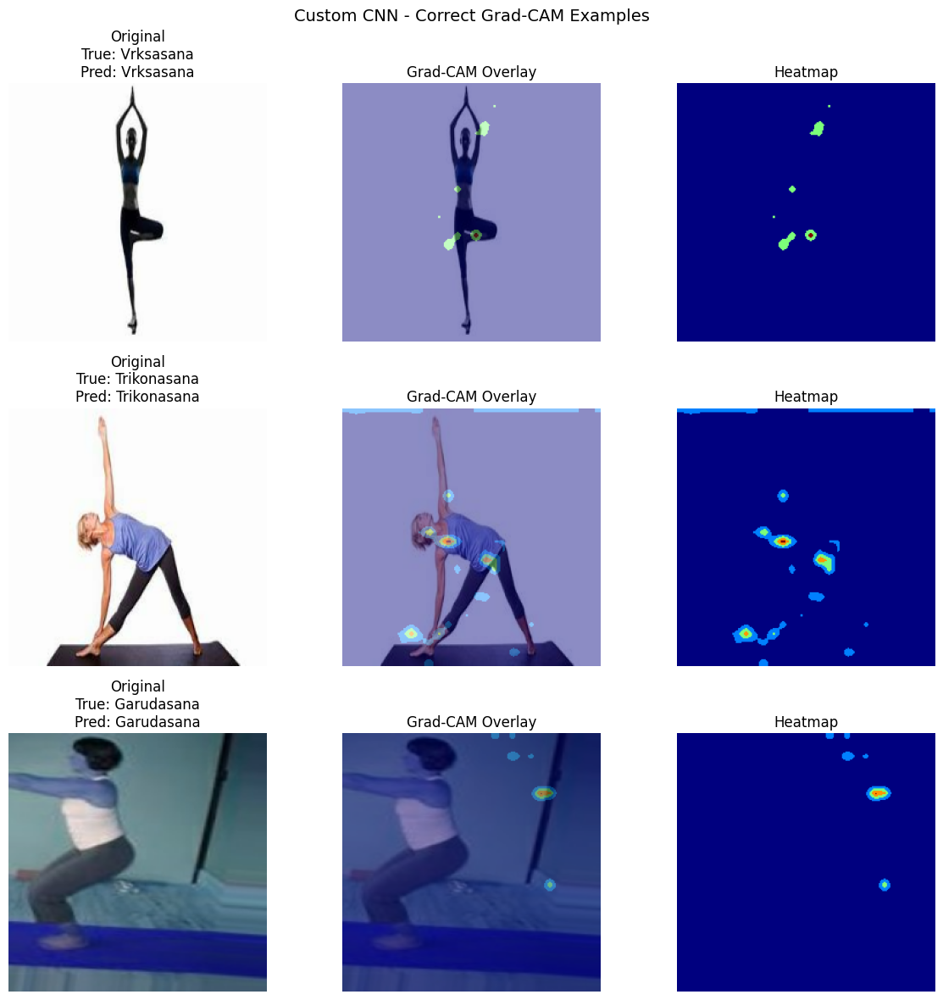

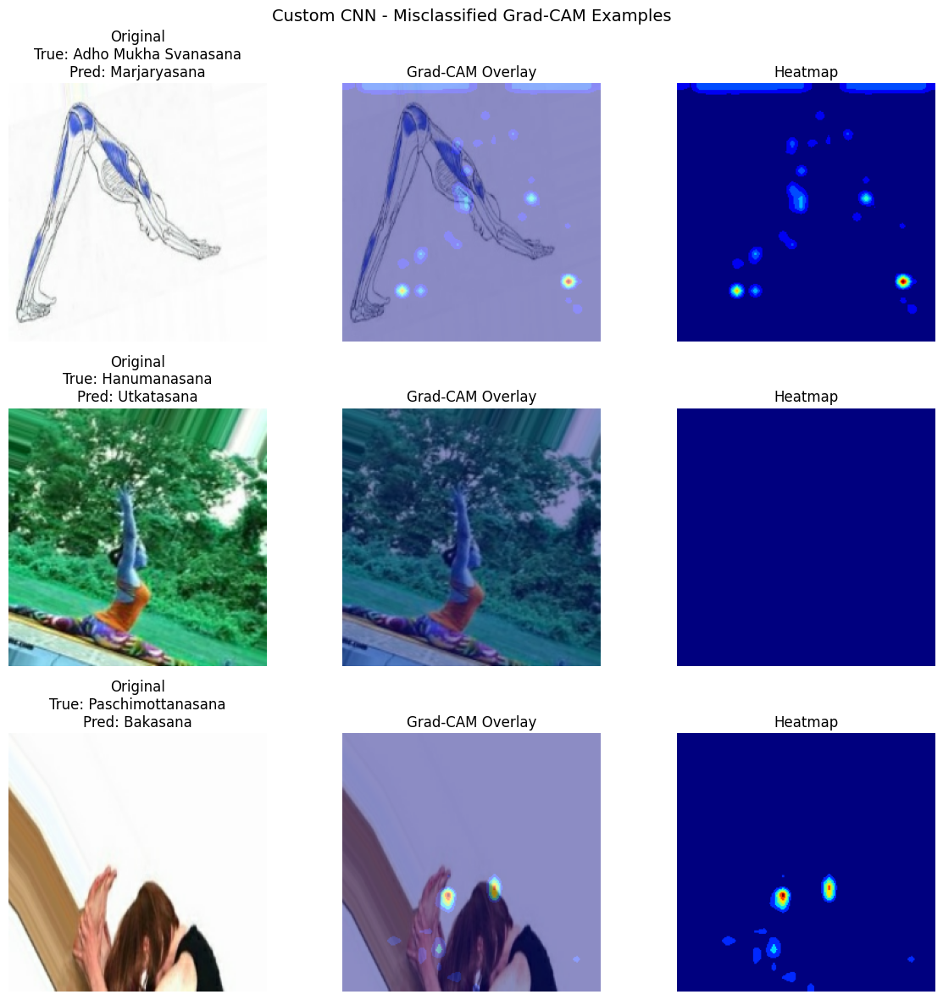

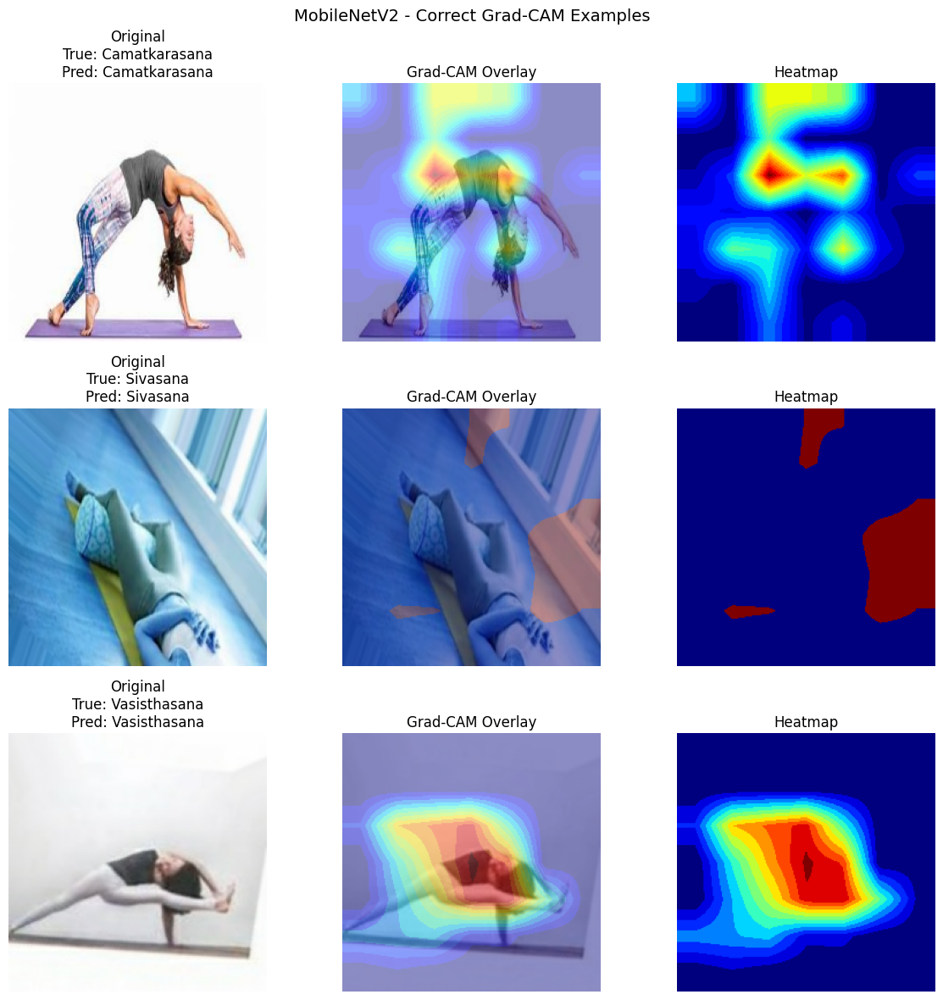

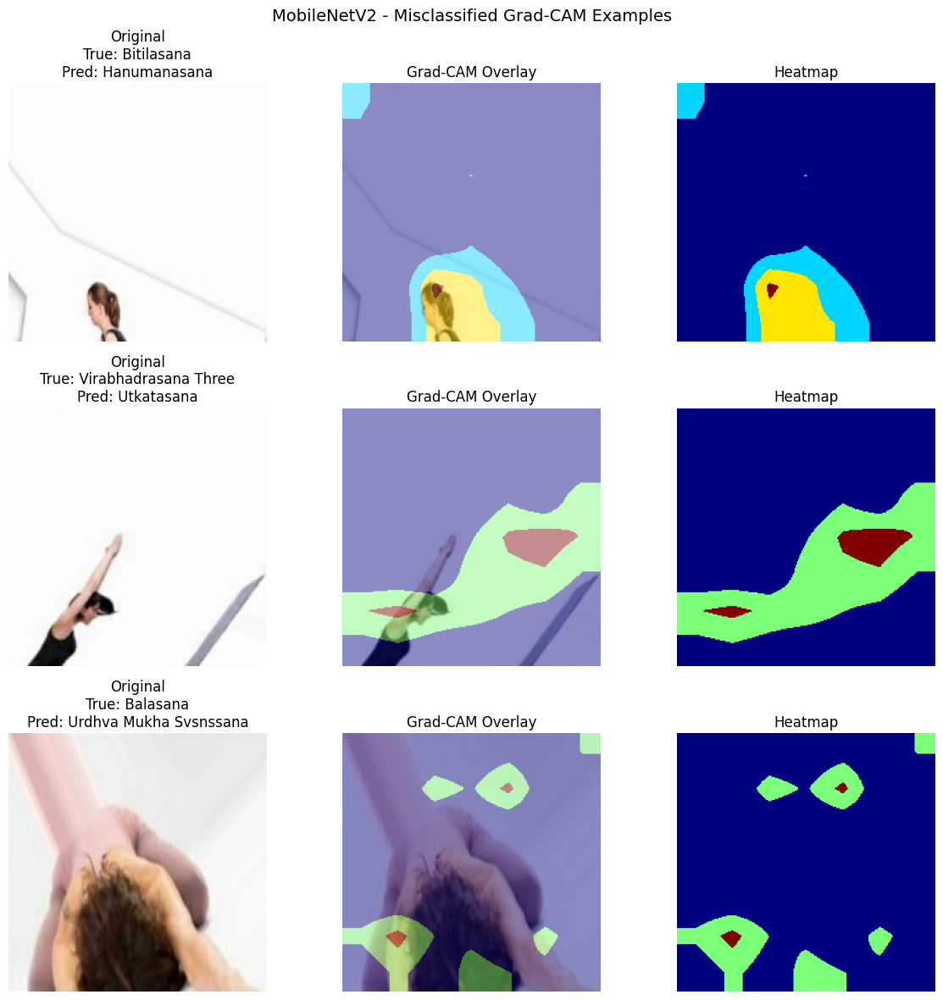

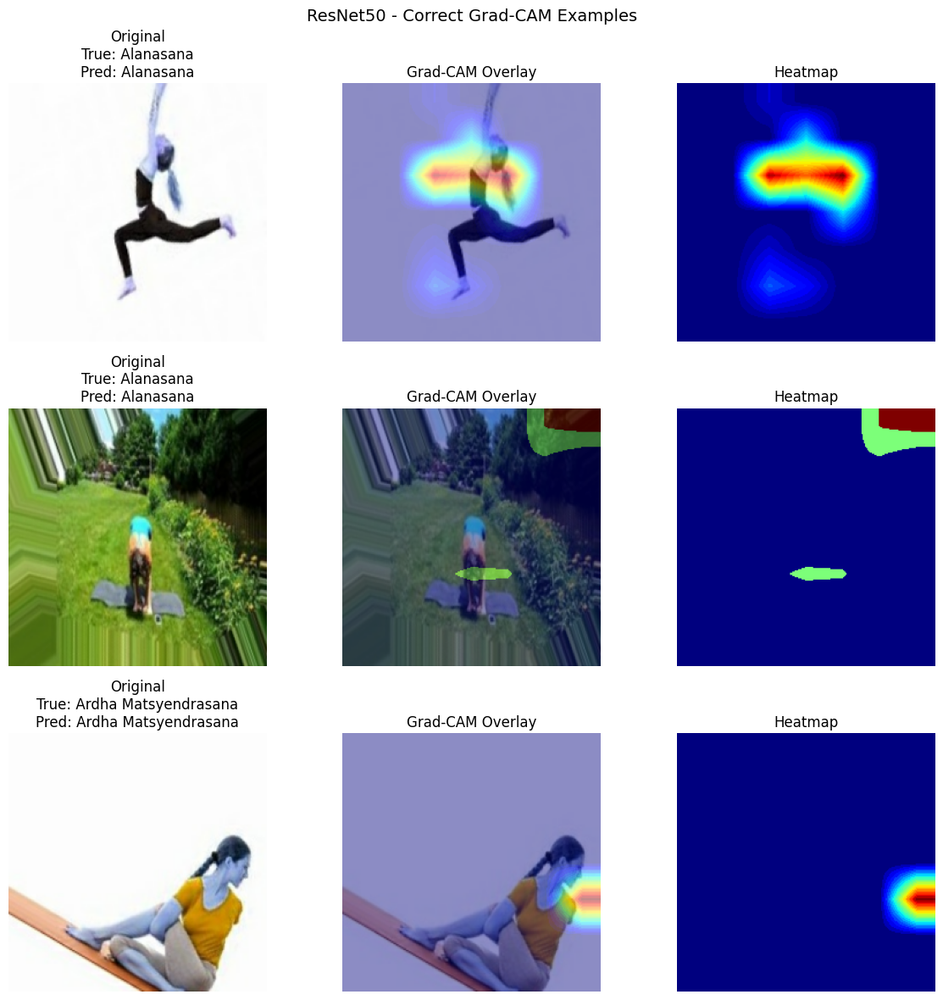

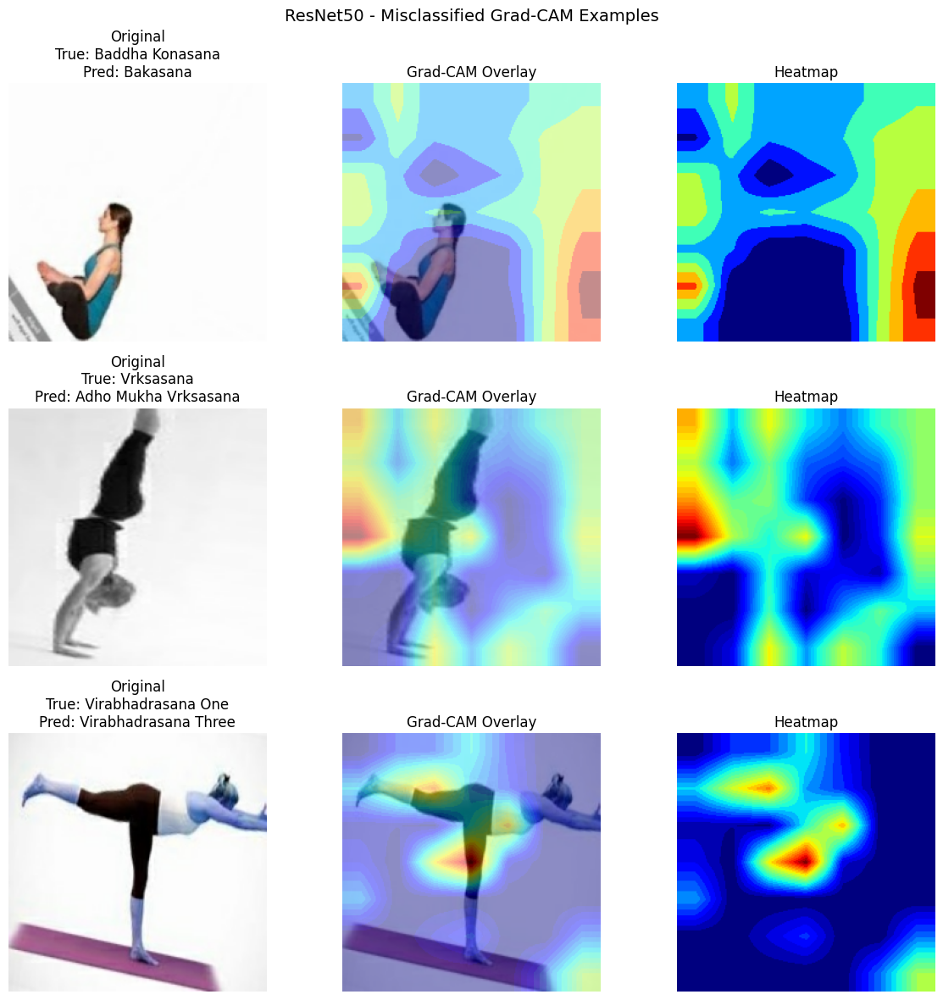

In [18]:
plot_gradcam_examples(custom_cnn, "Custom CNN", test_paths, y_true_c, y_pred_c, class_names, "custom_cnn")
plot_gradcam_examples(mobilenetv2, "MobileNetV2", test_paths, y_true_m, y_pred_m, class_names, "mobilenetv2")
plot_gradcam_examples(resnet50, "ResNet50", test_paths, y_true_r, y_pred_r, class_names, "resnet50")

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(3, 224, 224, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(50, 224, 224, 3))']
  warnings.warn(msg)


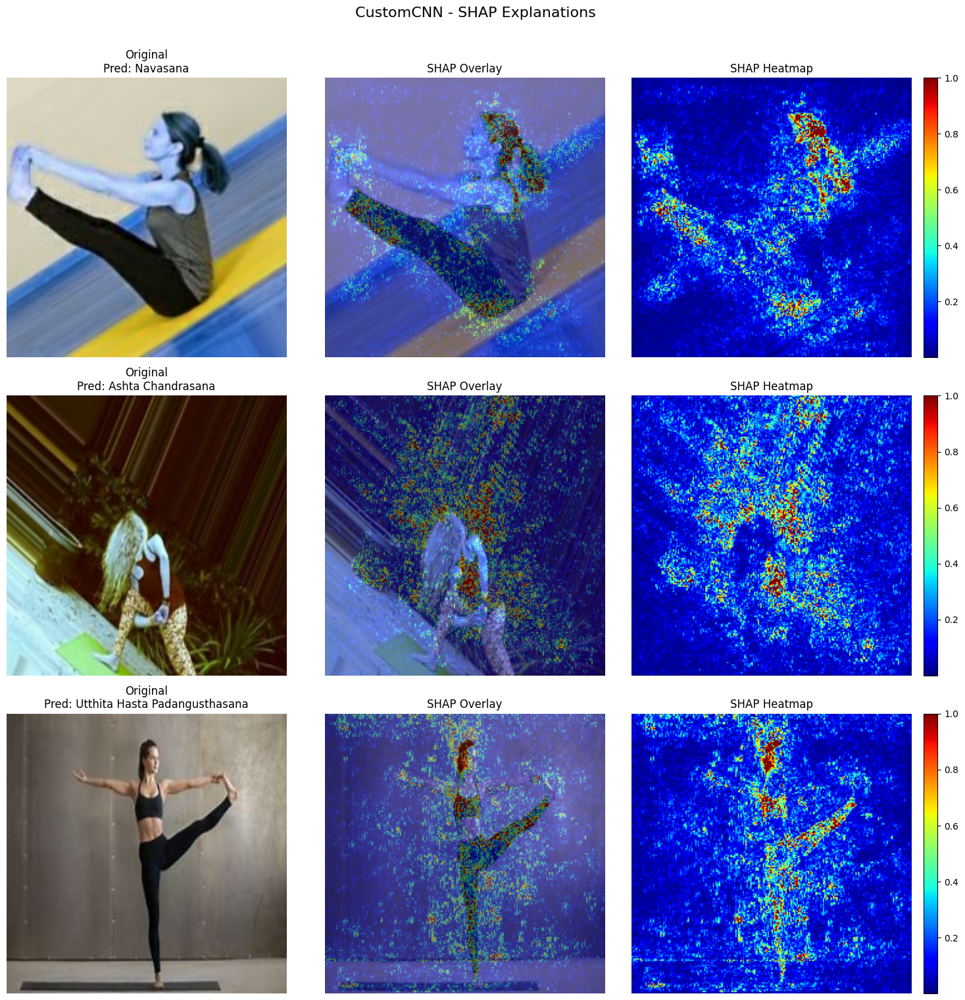

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(3, 224, 224, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(50, 224, 224, 3))']
  warnings.warn(msg)


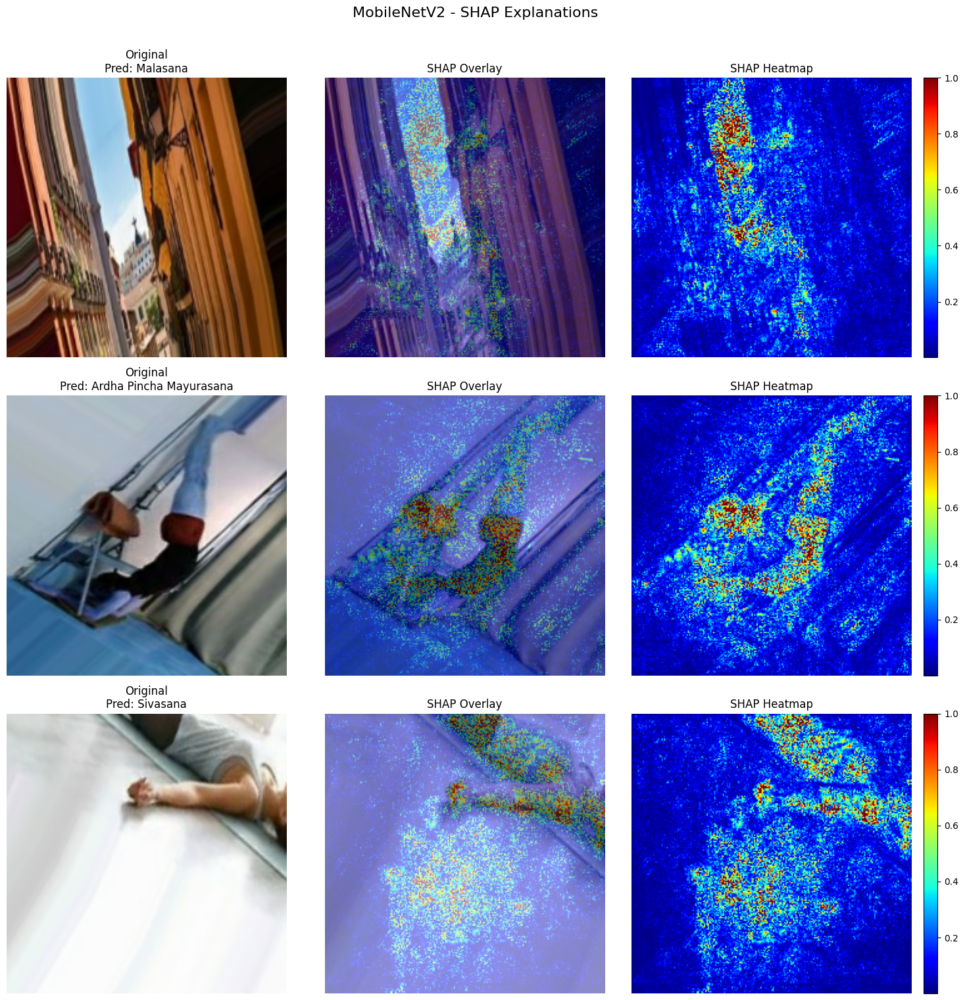

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(3, 224, 224, 3))']
  warnings.warn(msg)
/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor
Received: inputs=['Tensor(shape=(50, 224, 224, 3))']
  warnings.warn(msg)


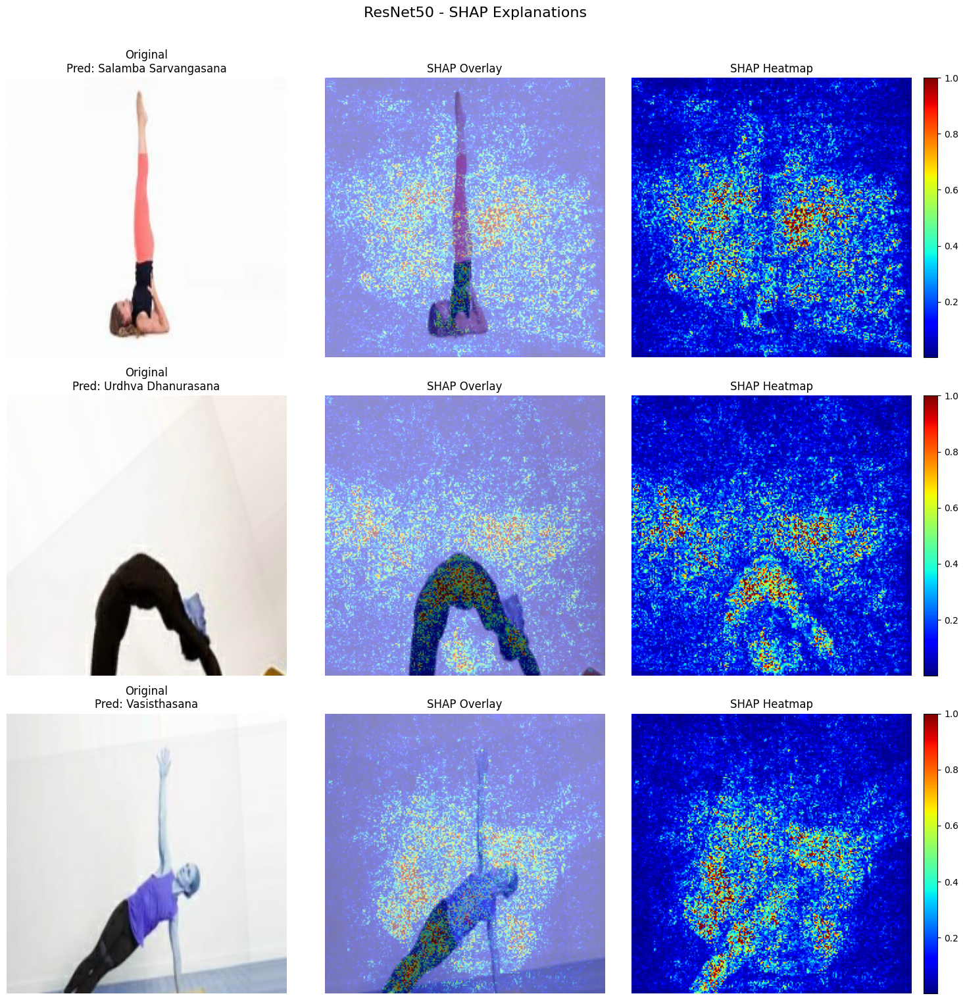

In [19]:
# SHAP explanations with robust plotting and fallbacks
def run_shap_explanations(model, model_name, sample_size=3, background_size=12):
    try:
        sample_size = min(sample_size, len(test_paths))
        background_size = min(background_size, len(train_paths))

        bg_indices = np.random.choice(len(train_paths), background_size, replace=False)
        sample_indices = np.random.choice(len(test_paths), sample_size, replace=False)

        background_imgs = np.stack(
            [load_single_image(train_paths[i]).numpy() for i in bg_indices],
            axis=0,
        ).astype(np.float32)

        sample_imgs = np.stack(
            [load_single_image(test_paths[i]).numpy() for i in sample_indices],
            axis=0,
        ).astype(np.float32)

        if background_imgs.ndim != 4 or sample_imgs.ndim != 4:
            raise ValueError(
                f"Expected rank-4 arrays for SHAP, got background {background_imgs.shape} and sample {sample_imgs.shape}"
            )

        explainer = shap.GradientExplainer(model, background_imgs)
        shap_values = explainer.shap_values(sample_imgs)

        preds = model.predict(sample_imgs, verbose=0)
        pred_classes = np.argmax(preds, axis=1)

        n_show = min(sample_size, 3)
        fig, axes = plt.subplots(n_show, 3, figsize=(15, 5 * n_show))
        if n_show == 1:
            axes = np.expand_dims(axes, axis=0)

        def get_class_shap_values(shap_values_obj, sample_idx, class_idx):
            # Supports both SHAP return styles:
            # 1) list[num_classes] of arrays shaped (N, H, W, C)
            # 2) ndarray shaped (N, H, W, C, num_classes)
            if isinstance(shap_values_obj, list):
                sv = shap_values_obj[class_idx][sample_idx]
            else:
                sv = np.asarray(shap_values_obj)
                if sv.ndim == 5:
                    sv = sv[sample_idx, ..., class_idx]
                elif sv.ndim == 4:
                    sv = sv[sample_idx]
                else:
                    raise ValueError(f"Unexpected SHAP array shape: {sv.shape}")
            return np.nan_to_num(sv, copy=False)

        for i in range(n_show):
            cls = int(pred_classes[i])
            sv = get_class_shap_values(shap_values, i, cls)

            if sv.ndim == 3:
                heat = np.mean(np.abs(sv), axis=-1)
            else:
                heat = np.abs(sv)

            heat = heat.astype(np.float32)
            p99 = np.percentile(heat, 99)
            if not np.isfinite(p99) or p99 <= 0:
                p99 = np.max(heat) if np.max(heat) > 0 else 1.0
            heat = np.clip(heat / (p99 + 1e-8), 0, 1)

            img_disp = sample_imgs[i].astype(np.float32)
            if img_disp.max() > 1.5:
                img_disp = img_disp / 255.0
            img_disp = np.clip(img_disp, 0, 1)

            axes[i, 0].imshow(img_disp)
            axes[i, 0].set_title(f"Original\nPred: {class_names[cls]}")
            axes[i, 0].axis("off")

            axes[i, 1].imshow(img_disp)
            axes[i, 1].imshow(heat, cmap="jet", alpha=0.45)
            axes[i, 1].set_title("SHAP Overlay")
            axes[i, 1].axis("off")

            im = axes[i, 2].imshow(heat, cmap="jet")
            axes[i, 2].set_title("SHAP Heatmap")
            axes[i, 2].axis("off")
            fig.colorbar(im, ax=axes[i, 2], fraction=0.046, pad=0.04)

        plt.suptitle(f"{model_name} - SHAP Explanations", y=1.01, fontsize=16)
        plt.tight_layout()

        out_file = os.path.join(FIG_DIR, f"{model_name.lower()}_shap.pdf")
        plt.savefig(out_file, format="pdf", bbox_inches="tight")
        plt.show()
        plt.close()

    except Exception as e:
        print(f"SHAP failed for {model_name}: {e}")

run_shap_explanations(custom_cnn, "CustomCNN")
run_shap_explanations(mobilenetv2, "MobileNetV2")
run_shap_explanations(resnet50, "ResNet50")

In [20]:
print("All outputs saved to:", OUTPUT_DIR)
print("Figures saved in:", FIG_DIR)
print("Tables saved in:", TAB_DIR)
print("Models saved in:", MODEL_DIR)

All outputs saved to: /kaggle/working/yoga_pose_outputs
Figures saved in: /kaggle/working/yoga_pose_outputs/figures
Tables saved in: /kaggle/working/yoga_pose_outputs/tables
Models saved in: /kaggle/working/yoga_pose_outputs/models
